# Классификация персонажей One Piece с помощью CNN
## Baseline (SimpleCNN) · ResNet50 · EfficientNetB0 (PyTorch)

**Задача:** 18-классовая классификация персонажей аниме One Piece

**Структура ноутбука:**
1. Импорты и конфигурация
2. Конфигурация датасета
3. Расширенный EDA (распределение классов, размеры, интенсивность пикселей, имбаланс)
4. Подготовка данных и аугментация
5. Построение и обучение моделей:
   - 5.1 Вспомогательные функции
   - 5.2 Baseline: SimpleCNN (обучение с нуля)
   - 5.3 ResNet50 (transfer learning, двухэтапное обучение)
   - 5.4 EfficientNetB0 (transfer learning, двухэтапное обучение)
6. Оценка моделей (метрики + матрица ошибок для всех трёх)
7. Сравнение всех трёх моделей
8. Grad-CAM
9. Анализ ошибок
10. Итоговый отчёт


## 1. Импорты и конфигурация

In [1]:
import os, copy, time, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from PIL import Image
warnings.filterwarnings('ignore')

import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
from torch.utils.data import DataLoader, Subset
from torchvision import datasets, transforms, models
from torchvision.models import ResNet50_Weights, EfficientNet_B0_Weights
from tqdm import tqdm

import kagglehub

from sklearn.metrics import (
    classification_report, confusion_matrix,
    accuracy_score, precision_score, recall_score, f1_score
)

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'PyTorch  : {torch.__version__}')
print(f'Device   : {DEVICE}')
if DEVICE.type == 'cuda':
    print(f'GPU      : {torch.cuda.get_device_name(0)}')

SEED = 42
torch.manual_seed(SEED)
np.random.seed(SEED)

PyTorch  : 2.11.0+cu128
Device   : cuda
GPU      : NVIDIA GeForce GTX 1660 SUPER


## 2. Конфигурация датасета

In [2]:
# Download latest version
DATASET_PATH = kagglehub.dataset_download("ibrahimserouis99/one-piece-image-classifier")+"/Data/Data"

print("Path to dataset files:", DATASET_PATH)

CLASS_NAMES = [
    'Ace','Akainu','Brook','Chopper','Crocodile',
    'Franky','Jinbei','Kurohige','Law','Luffy',
    'Mihawk','Nami','Rayleigh','Robin','Sanji',
    'Shanks','Usopp','Zoro'
]

IMG_SIZE      = 224
BATCH_SIZE    = 32
NUM_CLASSES   = 18
EPOCHS_STAGE1 = 15
LR_STAGE1     = 1e-3
EPOCHS_STAGE2 = 15
LR_STAGE2     = 1e-5
UNFREEZE_N    = 30

print(f'Dataset    : {DATASET_PATH}')
print(f'Image size : {IMG_SIZE}x{IMG_SIZE}  Batch: {BATCH_SIZE}  Classes: {NUM_CLASSES}')

Path to dataset files: C:\Users\User\.cache\kagglehub\datasets\ibrahimserouis99\one-piece-image-classifier\versions\23/Data/Data
Dataset    : C:\Users\User\.cache\kagglehub\datasets\ibrahimserouis99\one-piece-image-classifier\versions\23/Data/Data
Image size : 224x224  Batch: 32  Classes: 18


## 3. EDA — анализ данных

In [3]:
dataset_dir = Path(DATASET_PATH)

class_counts = {}
for cls in CLASS_NAMES:
    d = dataset_dir / cls
    imgs = list(d.glob('*.jpg')) + list(d.glob('*.png')) + list(d.glob('*.jpeg')) if d.exists() else []
    class_counts[cls] = len(imgs)

total_images = sum(class_counts.values())
print(f'Всего изображений: {total_images}')
for cls, cnt in sorted(class_counts.items(), key=lambda x: -x[1]):
    print(f'  {cls:<12}: {cnt:>5}')

Всего изображений: 11737
  Nami        :   665
  Zoro        :   659
  Brook       :   657
  Luffy       :   654
  Akainu      :   651
  Crocodile   :   651
  Franky      :   651
  Jinbei      :   651
  Law         :   651
  Mihawk      :   651
  Rayleigh    :   651
  Robin       :   651
  Sanji       :   651
  Shanks      :   651
  Ace         :   648
  Chopper     :   648
  Kurohige    :   648
  Usopp       :   648


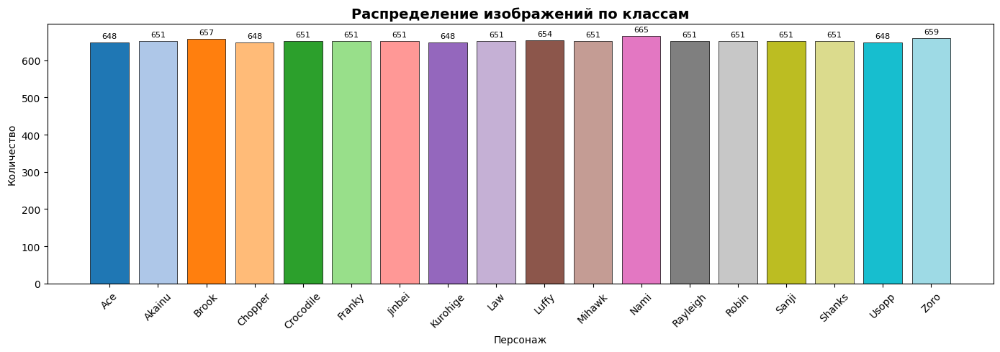

In [4]:
fig, ax = plt.subplots(figsize=(14,5))
colors = plt.cm.tab20(np.linspace(0,1,NUM_CLASSES))
bars = ax.bar(class_counts.keys(), class_counts.values(), color=colors, edgecolor='black', lw=0.5)
for bar, val in zip(bars, class_counts.values()):
    ax.text(bar.get_x()+bar.get_width()/2, bar.get_height()+8, str(val), ha='center', va='bottom', fontsize=8)
ax.set_title('Распределение изображений по классам', fontsize=14, fontweight='bold')
ax.set_xlabel('Персонаж'); ax.set_ylabel('Количество'); ax.tick_params(axis='x', rotation=45)
plt.tight_layout(); plt.savefig('../artifacts/class_distribution.png', dpi=150, bbox_inches='tight'); plt.show()

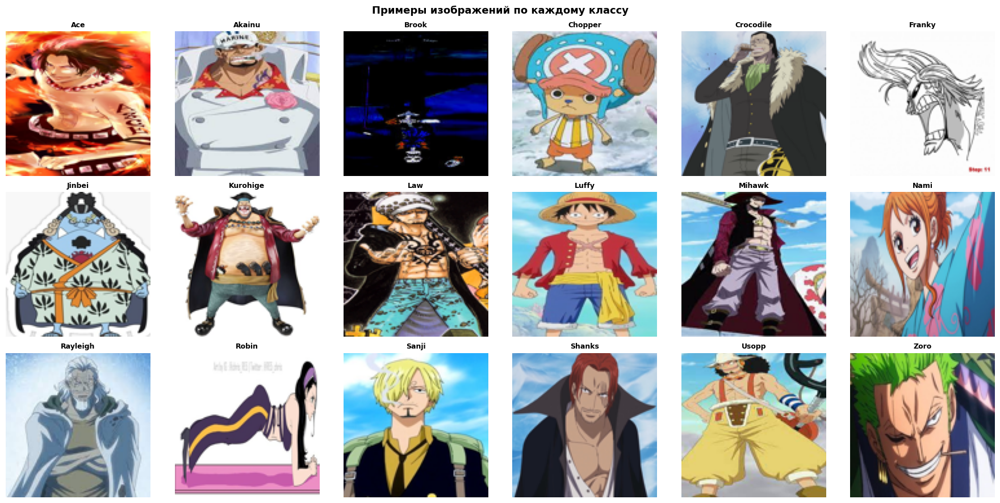

In [5]:
fig, axes = plt.subplots(3, 6, figsize=(18,9))
for idx, cls in enumerate(CLASS_NAMES):
    d = dataset_dir / cls
    imgs = list(d.glob('*.jpg')) + list(d.glob('*.png')) + list(d.glob('*.jpeg'))
    ax = axes[idx // 6][idx % 6]
    if imgs: ax.imshow(Image.open(imgs[0]).convert('RGB').resize((112,112)))
    ax.set_title(cls, fontsize=9, fontweight='bold'); ax.axis('off')
plt.suptitle('Примеры изображений по каждому классу', fontsize=13, fontweight='bold')
plt.tight_layout(); plt.savefig('../artifacts/sample_images.png', dpi=150, bbox_inches='tight'); plt.show()

Ширина  — мин:  63  макс:5108  среднее:433.4  медиана:300.0
Высота  — мин:  77  макс:6412  среднее:395.0  медиана:258.0


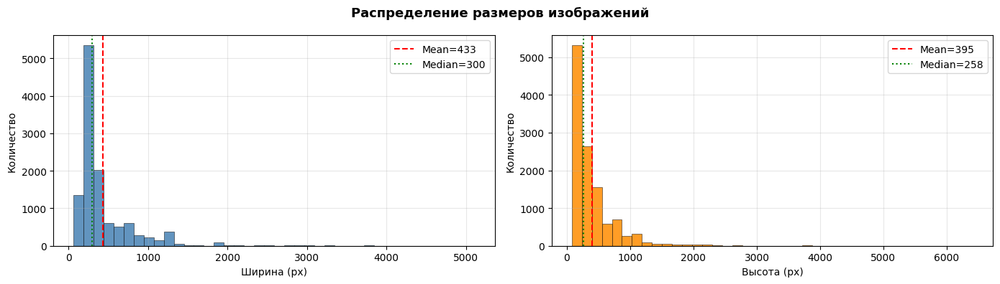

In [6]:
# EDA: статистика размеров изображений 
widths, heights = [], []
for cls in CLASS_NAMES:
    for ext in ('*.jpg','*.png','*.jpeg'):
        for p in (dataset_dir/cls).glob(ext):
            try:
                with Image.open(p) as im:
                    w, h = im.size
                    widths.append(w); heights.append(h)
            except:
                pass

widths  = np.array(widths)
heights = np.array(heights)
print(f'Ширина  — мин:{widths.min():4d}  макс:{widths.max():4d}  среднее:{widths.mean():.1f}  медиана:{np.median(widths):.1f}')
print(f'Высота  — мин:{heights.min():4d}  макс:{heights.max():4d}  среднее:{heights.mean():.1f}  медиана:{np.median(heights):.1f}')

fig, axes = plt.subplots(1, 2, figsize=(14, 4))
for ax, data, label, color in zip(
        axes,
        [widths, heights],
        ['Ширина (px)', 'Высота (px)'],
        ['steelblue', 'darkorange']):
    ax.hist(data, bins=40, color=color, edgecolor='black', lw=0.4, alpha=0.85)
    ax.axvline(data.mean(), color='red', ls='--', lw=1.5, label=f'Mean={data.mean():.0f}')
    ax.axvline(np.median(data), color='green', ls=':', lw=1.5, label=f'Median={np.median(data):.0f}')
    ax.set_xlabel(label); ax.set_ylabel('Количество'); ax.legend(); ax.grid(alpha=0.3)
fig.suptitle('Распределение размеров изображений', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('../artifacts/image_size_dist.png', dpi=150, bbox_inches='tight')
plt.show()


Aspect ratio — мин:0.23  макс:3.35  среднее:1.20
Channel mean (R,G,B): [0.54706086 0.52587957 0.50254104]
Channel std  (R,G,B): [0.33047853 0.31514931 0.32062713]


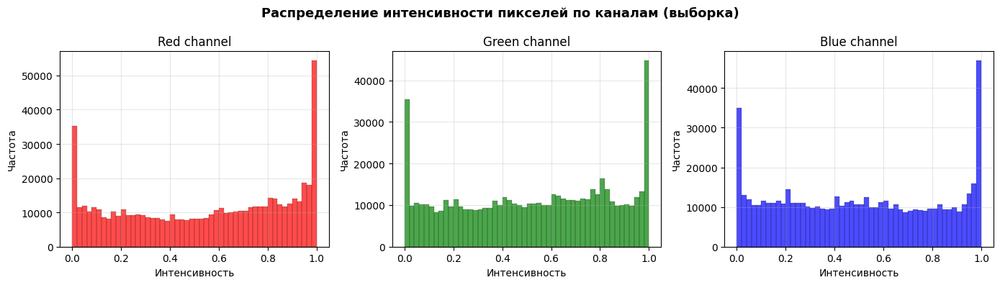

In [7]:
# EDA: aspect ratio + pixel-intensity statistics 
aspect = widths / heights
print(f'Aspect ratio — мин:{aspect.min():.2f}  макс:{aspect.max():.2f}  среднее:{aspect.mean():.2f}')

sample_imgs = []
for cls in CLASS_NAMES:
    for ext in ('*.jpg','*.png','*.jpeg'):
        for p in list((dataset_dir/cls).glob(ext))[:5]:
            try:
                sample_imgs.append(np.array(Image.open(p).convert('RGB').resize((64,64))) / 255.0)
            except:
                pass

sample_arr = np.stack(sample_imgs)  # (N,64,64,3)
chan_mean = sample_arr.mean(axis=(0,1,2))
chan_std  = sample_arr.std(axis=(0,1,2))
print(f'Channel mean (R,G,B): {chan_mean}')
print(f'Channel std  (R,G,B): {chan_std}')

fig, axes = plt.subplots(1, 3, figsize=(14, 4))
for ax, ch, name, color in zip(axes, [0,1,2], ['Red','Green','Blue'], ['red','green','blue']):
    ax.hist(sample_arr[:,:,:,ch].flatten(), bins=50, color=color, alpha=0.7, edgecolor='black', lw=0.2)
    ax.set_title(f'{name} channel'); ax.set_xlabel('Интенсивность'); ax.set_ylabel('Частота'); ax.grid(alpha=0.3)
fig.suptitle('Распределение интенсивности пикселей по каналам (выборка)', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('../artifacts/pixel_intensity.png', dpi=150, bbox_inches='tight')
plt.show()


Имбаланс (max/min)  : 1.03x
Коэффициент вариации: 0.006
Класс с макс. изображений: Nami (665)
Класс с мин. изображений : Ace (648)


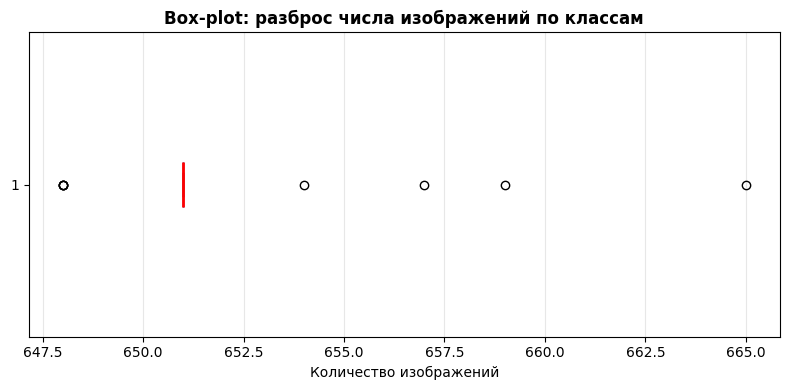

In [8]:
# EDA: коэффициент дисбаланса классов
counts_arr = np.array(list(class_counts.values()))
imbalance_ratio = counts_arr.max() / counts_arr.min()
cv = counts_arr.std() / counts_arr.mean()
print(f'Имбаланс (max/min)  : {imbalance_ratio:.2f}x')
print(f'Коэффициент вариации: {cv:.3f}')
print(f'Класс с макс. изображений: {max(class_counts, key=class_counts.get)} ({counts_arr.max()})')
print(f'Класс с мин. изображений : {min(class_counts, key=class_counts.get)} ({counts_arr.min()})')

# Box-plot распределения числа изображений
fig, ax = plt.subplots(figsize=(8, 4))
ax.boxplot(counts_arr, vert=False, patch_artist=True,
           boxprops=dict(facecolor='lightblue', color='navy'),
           medianprops=dict(color='red', lw=2))
ax.set_xlabel('Количество изображений')
ax.set_title('Box-plot: разброс числа изображений по классам', fontsize=12, fontweight='bold')
ax.grid(axis='x', alpha=0.3)
plt.tight_layout()
plt.savefig('../artifacts/class_imbalance_boxplot.png', dpi=150, bbox_inches='tight')
plt.show()


## 4. Подготовка данных и аугментация

In [9]:
MEAN = [0.485, 0.456, 0.406]
STD  = [0.229, 0.224, 0.225]

train_tf = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(20),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.RandomAffine(degrees=0, translate=(0.15,0.15), shear=10),
    transforms.RandomResizedCrop(IMG_SIZE, scale=(0.85,1.0)),
    transforms.ToTensor(),
    transforms.Normalize(mean=MEAN, std=STD)
])

val_tf = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=MEAN, std=STD)
])

full_ds = datasets.ImageFolder(DATASET_PATH)
n_total = len(full_ds)
n_val   = int(0.2 * n_total)
n_train = n_total - n_val

gen = torch.Generator().manual_seed(SEED)
indices = torch.randperm(n_total, generator=gen).tolist()
train_idx, val_idx = indices[:n_train], indices[n_train:]

train_ds_all = datasets.ImageFolder(DATASET_PATH, transform=train_tf)
val_ds_all   = datasets.ImageFolder(DATASET_PATH, transform=val_tf)

train_dataset = Subset(train_ds_all, train_idx)
val_dataset   = Subset(val_ds_all,   val_idx)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True,
                          num_workers=2, pin_memory=(DEVICE.type=='cuda'))
val_loader   = DataLoader(val_dataset,   batch_size=BATCH_SIZE, shuffle=False,
                          num_workers=2, pin_memory=(DEVICE.type=='cuda'))

idx_to_class    = {v: k for k, v in full_ds.class_to_idx.items()}
classes_ordered = [idx_to_class[i] for i in range(NUM_CLASSES)]

print(f'Train: {n_train}  |  Val: {n_val}')
print(f'Классы: {classes_ordered}')

Train: 9390  |  Val: 2347
Классы: ['Ace', 'Akainu', 'Brook', 'Chopper', 'Crocodile', 'Franky', 'Jinbei', 'Kurohige', 'Law', 'Luffy', 'Mihawk', 'Nami', 'Rayleigh', 'Robin', 'Sanji', 'Shanks', 'Usopp', 'Zoro']


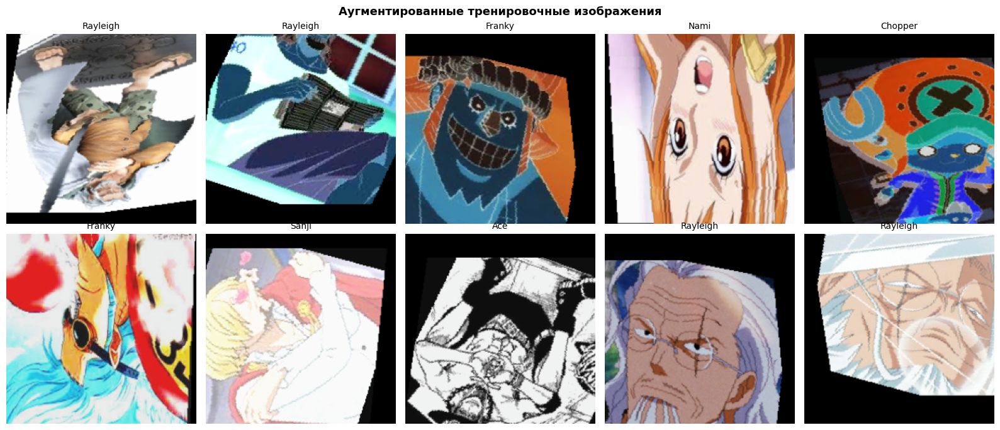

In [10]:
mean_np = np.array(MEAN); std_np = np.array(STD)

def denorm(t):
    img = t.numpy().transpose(1,2,0)
    return np.clip(std_np * img + mean_np, 0, 1)

imgs_b, labels_b = next(iter(train_loader))
fig, axes = plt.subplots(2, 5, figsize=(16,7))
for i, ax in enumerate(axes.flatten()):
    ax.imshow(denorm(imgs_b[i])); ax.set_title(idx_to_class[labels_b[i].item()], fontsize=10); ax.axis('off')
plt.suptitle('Аугментированные тренировочные изображения', fontsize=13, fontweight='bold')
plt.tight_layout(); plt.savefig('../artifacts/augmented_samples.png', dpi=150, bbox_inches='tight'); plt.show()

## 5. Построение и обучение моделей
### 5.1 Вспомогательные функции

In [11]:
def build_resnet50(freeze_base=True):
    m = models.resnet50(weights=ResNet50_Weights.IMAGENET1K_V2)
    if freeze_base:
        for p in m.parameters(): p.requires_grad = False
    m.fc = nn.Sequential(
        nn.Linear(m.fc.in_features, 512), nn.BatchNorm1d(512), nn.ReLU(True), nn.Dropout(0.4),
        nn.Linear(512, 256), nn.ReLU(True), nn.Dropout(0.3),
        nn.Linear(256, NUM_CLASSES)
    )
    return m


def build_efficientnet(freeze_base=True):
    m = models.efficientnet_b0(weights=EfficientNet_B0_Weights.IMAGENET1K_V1)
    if freeze_base:
        for p in m.features.parameters(): p.requires_grad = False
    in_f = m.classifier[1].in_features
    m.classifier = nn.Sequential(
        nn.Dropout(0.3), nn.Linear(in_f, 512), nn.BatchNorm1d(512), nn.ReLU(True), nn.Dropout(0.4),
        nn.Linear(512, 256), nn.ReLU(True), nn.Dropout(0.3),
        nn.Linear(256, NUM_CLASSES)
    )
    return m


def unfreeze_last(model, n):
    for p in list(model.parameters())[-n:]: p.requires_grad = True
    tr  = sum(p.numel() for p in model.parameters() if p.requires_grad)
    tot = sum(p.numel() for p in model.parameters())
    print(f'  Trainable: {tr:,} / {tot:,}')


def train_one_epoch(model, loader, criterion, optimizer):
    model.train()
    loss_sum, correct, total = 0.0, 0, 0
    for imgs, labels in tqdm(loader, leave=False):
        imgs, labels = imgs.to(DEVICE), labels.to(DEVICE)
        optimizer.zero_grad()
        out  = model(imgs)
        loss = criterion(out, labels)
        loss.backward(); optimizer.step()
        loss_sum += loss.item() * len(labels)
        correct  += (out.argmax(1) == labels).sum().item()
        total    += len(labels)
    return loss_sum/total, correct/total


@torch.no_grad()
def evaluate(model, loader, criterion):
    model.eval()
    loss_sum, correct, total = 0.0, 0, 0
    for imgs, labels in loader:
        imgs, labels = imgs.to(DEVICE), labels.to(DEVICE)
        out = model(imgs)
        loss_sum += criterion(out, labels).item() * len(labels)
        correct  += (out.argmax(1) == labels).sum().item()
        total    += len(labels)
    return loss_sum/total, correct/total


def train_stage(model, train_loader, val_loader, epochs, lr, tag):
    criterion = nn.CrossEntropyLoss(label_smoothing=0.05)
    optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=lr)
    sched     = lr_scheduler.ReduceLROnPlateau(optimizer, 'min', factor=0.3, patience=3, min_lr=1e-7)
    history   = {'tl':[],'vl':[],'ta':[],'va':[]}
    best_acc, best_w, pat = 0.0, copy.deepcopy(model.state_dict()), 0
    PATIENCE = 7
    print(f'\n--- {tag} | lr={lr} ---')
    for ep in range(1, epochs+1):
        t0 = time.time()
        tl, ta = train_one_epoch(model, train_loader, criterion, optimizer)
        vl, va = evaluate(model, val_loader, criterion)
        sched.step(vl)
        history['tl'].append(tl); history['vl'].append(vl)
        history['ta'].append(ta); history['va'].append(va)
        print(f'  Ep {ep:02d}/{epochs}  loss={tl:.4f} acc={ta:.4f}  val_loss={vl:.4f} val_acc={va:.4f}  [{time.time()-t0:.0f}s]')
        if va > best_acc:
            best_acc, best_w, pat = va, copy.deepcopy(model.state_dict()), 0
        else:
            pat += 1
            if pat >= PATIENCE: print('  EarlyStopping.'); break
    model.load_state_dict(best_w)
    print(f'  Best val_acc: {best_acc:.4f}')
    return history


def plot_history(h1, h2, name):
    acc = h1['ta']+h2['ta']; vacc = h1['va']+h2['va']
    loss= h1['tl']+h2['tl']; vloss= h1['vl']+h2['vl']
    sp  = len(h1['ta']); ep = range(1, len(acc)+1)
    fig, axes = plt.subplots(1,2,figsize=(15,5))
    fig.suptitle(f'История обучения — {name}', fontsize=14, fontweight='bold')
    for ax, tr, vl, title in zip(axes,[acc,loss],[vacc,vloss],['Accuracy','Loss']):
        ax.plot(ep, tr, 'b-o', ms=3, label='Train'); ax.plot(ep, vl, 'r-o', ms=3, label='Val')
        ax.axvline(sp, color='green', ls='--', lw=1.5, label='Fine-tuning')
        ax.set_title(title); ax.set_xlabel('Epoch'); ax.legend(); ax.grid(alpha=.3)
    plt.tight_layout(); plt.savefig(f'../artifacts/{name}_history.png', dpi=150, bbox_inches='tight'); plt.show()


print('Все функции определены.')

Все функции определены.


### 5.2 Baseline: SimpleCNN (обучение с нуля)

In [12]:
# Baseline: простая сверточная сеть без предобученных весов.
class SimpleCNN(nn.Module):
    """Лёгкая CNN: 3 блока Conv-BN-ReLU-MaxPool + два FC-слоя."""

    def __init__(self, num_classes=NUM_CLASSES):
        super().__init__()
        self.features = nn.Sequential(
            # Block 1
            nn.Conv2d(3, 32, 3, padding=1), nn.BatchNorm2d(32), nn.ReLU(True),
            nn.Conv2d(32, 32, 3, padding=1), nn.BatchNorm2d(32), nn.ReLU(True),
            nn.MaxPool2d(2), nn.Dropout2d(0.25),
            # Block 2
            nn.Conv2d(32, 64, 3, padding=1), nn.BatchNorm2d(64), nn.ReLU(True),
            nn.Conv2d(64, 64, 3, padding=1), nn.BatchNorm2d(64), nn.ReLU(True),
            nn.MaxPool2d(2), nn.Dropout2d(0.25),
            # Block 3
            nn.Conv2d(64, 128, 3, padding=1), nn.BatchNorm2d(128), nn.ReLU(True),
            nn.Conv2d(128, 128, 3, padding=1), nn.BatchNorm2d(128), nn.ReLU(True),
            nn.MaxPool2d(2), nn.Dropout2d(0.25),
        )
        self.classifier = nn.Sequential(
            nn.AdaptiveAvgPool2d(4),
            nn.Flatten(),
            nn.Linear(128 * 4 * 4, 512), nn.BatchNorm1d(512), nn.ReLU(True), nn.Dropout(0.5),
            nn.Linear(512, num_classes),
        )

    def forward(self, x):
        return self.classifier(self.features(x))


print('BASELINE: SimpleCNN (no pretrained weights)')
baseline = SimpleCNN(NUM_CLASSES).to(DEVICE)
tr  = sum(p.numel() for p in baseline.parameters() if p.requires_grad)
tot = sum(p.numel() for p in baseline.parameters())
print(f'Trainable / Total: {tr:,} / {tot:,}')


BASELINE: SimpleCNN (no pretrained weights)
Trainable / Total: 1,347,250 / 1,347,250


In [13]:
# Baseline обучается только в один этап (нет предобученных весов для разморозки)
EPOCHS_BASELINE = 20
h_b = train_stage(baseline, train_loader, val_loader, EPOCHS_BASELINE, LR_STAGE1, 'SimpleCNN | Baseline')
torch.save(baseline.state_dict(), '../artifacts/models/baseline_simplecnn.pth')
print('Сохранено: baseline_simplecnn.pth')



--- SimpleCNN | Baseline | lr=0.001 ---


  Ep 01/20  loss=2.8020 acc=0.1357  val_loss=2.4795 val_acc=0.2505  [75s]


  Ep 02/20  loss=2.5779 acc=0.2113  val_loss=2.3108 val_acc=0.3034  [75s]


  Ep 03/20  loss=2.4554 acc=0.2613  val_loss=2.1309 val_acc=0.3698  [75s]


  Ep 04/20  loss=2.3844 acc=0.2821  val_loss=2.0334 val_acc=0.4171  [74s]


  Ep 05/20  loss=2.3303 acc=0.2990  val_loss=1.9780 val_acc=0.4333  [75s]


  Ep 06/20  loss=2.2762 acc=0.3335  val_loss=1.9782 val_acc=0.4376  [74s]


  Ep 07/20  loss=2.2251 acc=0.3438  val_loss=1.9111 val_acc=0.4482  [74s]


  Ep 08/20  loss=2.1987 acc=0.3568  val_loss=1.8420 val_acc=0.4879  [74s]


  Ep 09/20  loss=2.1674 acc=0.3646  val_loss=1.7896 val_acc=0.5096  [74s]


  Ep 10/20  loss=2.1298 acc=0.3827  val_loss=1.7612 val_acc=0.5249  [74s]


  Ep 11/20  loss=2.1085 acc=0.3859  val_loss=1.7448 val_acc=0.5398  [74s]


  Ep 12/20  loss=2.0963 acc=0.3917  val_loss=1.7255 val_acc=0.5232  [74s]


  Ep 13/20  loss=2.0624 acc=0.4098  val_loss=1.6838 val_acc=0.5513  [74s]


  Ep 14/20  loss=2.0466 acc=0.4078  val_loss=1.6837 val_acc=0.5454  [74s]


  Ep 15/20  loss=2.0181 acc=0.4240  val_loss=1.6533 val_acc=0.5611  [74s]


  Ep 16/20  loss=1.9904 acc=0.4294  val_loss=1.6095 val_acc=0.5752  [74s]


  Ep 17/20  loss=1.9564 acc=0.4427  val_loss=1.5732 val_acc=0.5999  [74s]


  Ep 18/20  loss=1.9714 acc=0.4354  val_loss=1.5931 val_acc=0.5948  [74s]


  Ep 19/20  loss=1.9452 acc=0.4501  val_loss=1.5436 val_acc=0.6033  [74s]


  Ep 20/20  loss=1.9274 acc=0.4556  val_loss=1.5347 val_acc=0.6037  [74s]
  Best val_acc: 0.6037
Сохранено: baseline_simplecnn.pth


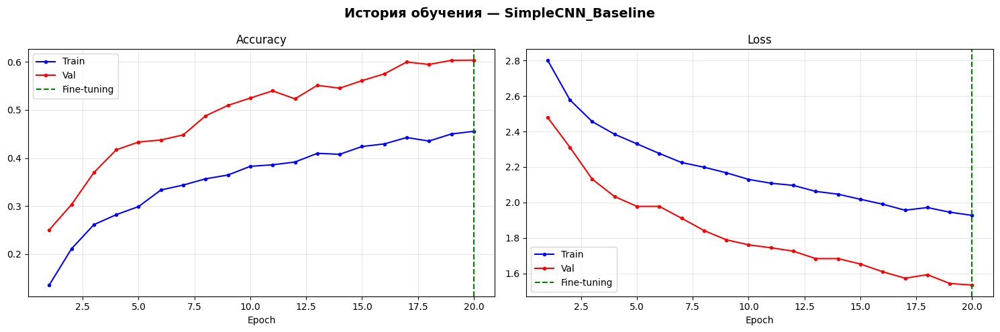

In [14]:
# Кривые обучения для baseline
hist_dummy = {'ta':[], 'va':[], 'tl':[], 'vl':[]}   # пустая «вторая стадия» — не нужна
plot_history(h_b, hist_dummy, 'SimpleCNN_Baseline')


### 5.3 Модель 1: ResNet50

In [15]:
print('МОДЕЛЬ 1: ResNet50')
resnet = build_resnet50(freeze_base=True).to(DEVICE)
tr = sum(p.numel() for p in resnet.parameters() if p.requires_grad)
tot= sum(p.numel() for p in resnet.parameters())
print(f'Trainable / Total: {tr:,} / {tot:,}')

МОДЕЛЬ 1: ResNet50
Trainable / Total: 1,186,066 / 24,694,098


In [16]:
h_r1 = train_stage(resnet, train_loader, val_loader, EPOCHS_STAGE1, LR_STAGE1, 'ResNet50 | Stage 1')


--- ResNet50 | Stage 1 | lr=0.001 ---


  Ep 01/15  loss=1.7597 acc=0.5165  val_loss=1.2569 val_acc=0.6881  [65s]


  Ep 02/15  loss=1.2369 acc=0.7006  val_loss=1.1693 val_acc=0.7133  [65s]


  Ep 03/15  loss=1.1379 acc=0.7297  val_loss=1.0738 val_acc=0.7563  [65s]


  Ep 04/15  loss=1.0441 acc=0.7606  val_loss=1.0656 val_acc=0.7495  [66s]


  Ep 05/15  loss=1.0113 acc=0.7748  val_loss=0.9976 val_acc=0.7746  [65s]


  Ep 06/15  loss=0.9848 acc=0.7853  val_loss=0.9903 val_acc=0.7806  [65s]


  Ep 07/15  loss=0.9394 acc=0.8004  val_loss=0.9371 val_acc=0.8049  [66s]


  Ep 08/15  loss=0.9254 acc=0.8092  val_loss=0.9486 val_acc=0.8010  [65s]


  Ep 09/15  loss=0.9054 acc=0.8183  val_loss=0.9073 val_acc=0.8091  [65s]


  Ep 10/15  loss=0.8820 acc=0.8233  val_loss=0.9152 val_acc=0.8100  [66s]


  Ep 11/15  loss=0.8651 acc=0.8333  val_loss=0.9133 val_acc=0.8095  [66s]


  Ep 12/15  loss=0.8584 acc=0.8372  val_loss=0.8709 val_acc=0.8283  [66s]


  Ep 13/15  loss=0.8549 acc=0.8341  val_loss=0.8771 val_acc=0.8215  [66s]


  Ep 14/15  loss=0.8317 acc=0.8435  val_loss=0.8688 val_acc=0.8266  [67s]


  Ep 15/15  loss=0.8148 acc=0.8491  val_loss=0.8882 val_acc=0.8219  [66s]
  Best val_acc: 0.8283


In [17]:
print('Разморозка ResNet50...')
unfreeze_last(resnet, UNFREEZE_N)
h_r2 = train_stage(resnet, train_loader, val_loader, EPOCHS_STAGE2, LR_STAGE2, 'ResNet50 | Fine-tuning')
torch.save(resnet.state_dict(), '../artifacts/models/resnet50_onepiece.pth')
print('Сохранено: resnet50_onepiece.pth')

Разморозка ResNet50...
  Trainable: 12,214,546 / 24,694,098

--- ResNet50 | Fine-tuning | lr=1e-05 ---


  0%|          | 0/294 [00:00<?, ?it/s]

  Ep 01/15  loss=0.7998 acc=0.8555  val_loss=0.8333 val_acc=0.8475  [66s]


  Ep 02/15  loss=0.7557 acc=0.8752  val_loss=0.8134 val_acc=0.8496  [66s]


  Ep 03/15  loss=0.7341 acc=0.8820  val_loss=0.8023 val_acc=0.8530  [67s]


  Ep 04/15  loss=0.7162 acc=0.8917  val_loss=0.7910 val_acc=0.8602  [66s]


  Ep 05/15  loss=0.7054 acc=0.8958  val_loss=0.7803 val_acc=0.8641  [66s]


  Ep 06/15  loss=0.7010 acc=0.8997  val_loss=0.7569 val_acc=0.8730  [67s]


  Ep 07/15  loss=0.6800 acc=0.9060  val_loss=0.7524 val_acc=0.8760  [67s]


  Ep 08/15  loss=0.6786 acc=0.9048  val_loss=0.7438 val_acc=0.8794  [66s]


  Ep 09/15  loss=0.6654 acc=0.9137  val_loss=0.7171 val_acc=0.8892  [68s]


  Ep 10/15  loss=0.6542 acc=0.9150  val_loss=0.7237 val_acc=0.8850  [66s]


  Ep 11/15  loss=0.6504 acc=0.9177  val_loss=0.7216 val_acc=0.8914  [67s]


  Ep 12/15  loss=0.6535 acc=0.9170  val_loss=0.7195 val_acc=0.8914  [66s]


  Ep 13/15  loss=0.6316 acc=0.9224  val_loss=0.7027 val_acc=0.8965  [66s]


  Ep 14/15  loss=0.6297 acc=0.9258  val_loss=0.7088 val_acc=0.8926  [66s]


  Ep 15/15  loss=0.6239 acc=0.9289  val_loss=0.6969 val_acc=0.8994  [67s]
  Best val_acc: 0.8994
Сохранено: resnet50_onepiece.pth


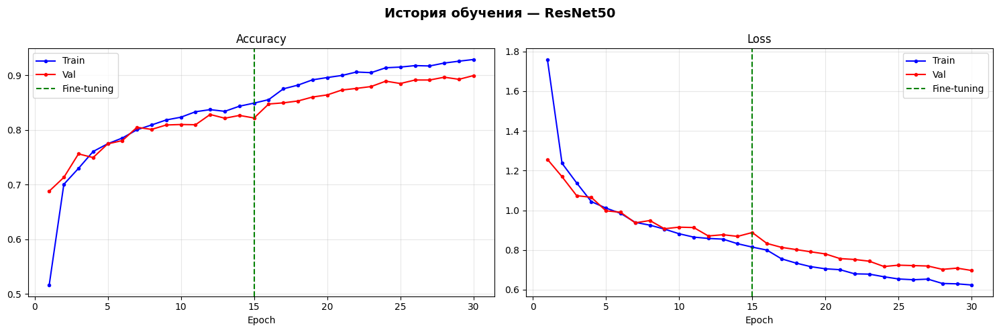

In [18]:
plot_history(h_r1, h_r2, 'ResNet50')

### 5.4 Модель 2: EfficientNetB0

In [19]:
print('МОДЕЛЬ 2: EfficientNetB0')
effnet = build_efficientnet(freeze_base=True).to(DEVICE)
tr = sum(p.numel() for p in effnet.parameters() if p.requires_grad)
tot= sum(p.numel() for p in effnet.parameters())
print(f'Trainable / Total: {tr:,} / {tot:,}')

МОДЕЛЬ 2: EfficientNetB0
Trainable / Total: 792,850 / 4,800,398


In [20]:
h_e1 = train_stage(effnet, train_loader, val_loader, EPOCHS_STAGE1, LR_STAGE1, 'EfficientNetB0 | Stage 1')


--- EfficientNetB0 | Stage 1 | lr=0.001 ---


  Ep 01/15  loss=1.9788 acc=0.4359  val_loss=1.5529 val_acc=0.5914  [65s]


  Ep 02/15  loss=1.6009 acc=0.5683  val_loss=1.4437 val_acc=0.6216  [64s]


  Ep 03/15  loss=1.5283 acc=0.5856  val_loss=1.3538 val_acc=0.6689  [66s]


  Ep 04/15  loss=1.4610 acc=0.6159  val_loss=1.3388 val_acc=0.6660  [65s]


  Ep 05/15  loss=1.4343 acc=0.6255  val_loss=1.3116 val_acc=0.6711  [65s]


  Ep 06/15  loss=1.3987 acc=0.6370  val_loss=1.3050 val_acc=0.6762  [65s]


  Ep 07/15  loss=1.3798 acc=0.6422  val_loss=1.2807 val_acc=0.6894  [66s]


  Ep 08/15  loss=1.3441 acc=0.6560  val_loss=1.2587 val_acc=0.6839  [77s]


  Ep 09/15  loss=1.3276 acc=0.6610  val_loss=1.2202 val_acc=0.7073  [75s]


  Ep 10/15  loss=1.3209 acc=0.6590  val_loss=1.2306 val_acc=0.6932  [67s]


  Ep 11/15  loss=1.3068 acc=0.6721  val_loss=1.2298 val_acc=0.6954  [66s]


  Ep 12/15  loss=1.2909 acc=0.6701  val_loss=1.1905 val_acc=0.7226  [65s]


  Ep 13/15  loss=1.2924 acc=0.6727  val_loss=1.1615 val_acc=0.7171  [65s]


  Ep 14/15  loss=1.2559 acc=0.6843  val_loss=1.1662 val_acc=0.7205  [65s]


  Ep 15/15  loss=1.2506 acc=0.6865  val_loss=1.1363 val_acc=0.7401  [65s]
  Best val_acc: 0.7401


In [21]:
print('Разморозка EfficientNetB0...')
unfreeze_last(effnet, UNFREEZE_N)
h_e2 = train_stage(effnet, train_loader, val_loader, EPOCHS_STAGE2, LR_STAGE2, 'EfficientNetB0 | Fine-tuning')
torch.save(effnet.state_dict(), '../artifacts/models/efficientnetb0_onepiece.pth')
print('Сохранено: efficientnetb0_onepiece.pth')

Разморозка EfficientNetB0...
  Trainable: 2,200,306 / 4,800,398

--- EfficientNetB0 | Fine-tuning | lr=1e-05 ---


  Ep 01/15  loss=1.2051 acc=0.7039  val_loss=1.1247 val_acc=0.7307  [66s]


  Ep 02/15  loss=1.1757 acc=0.7161  val_loss=1.0808 val_acc=0.7542  [66s]


  Ep 03/15  loss=1.1458 acc=0.7237  val_loss=1.0567 val_acc=0.7533  [64s]


  Ep 04/15  loss=1.1343 acc=0.7331  val_loss=1.0459 val_acc=0.7682  [66s]


  Ep 05/15  loss=1.1133 acc=0.7394  val_loss=1.0177 val_acc=0.7733  [66s]


  Ep 06/15  loss=1.0899 acc=0.7540  val_loss=0.9827 val_acc=0.7844  [66s]


  Ep 07/15  loss=1.0938 acc=0.7435  val_loss=1.0018 val_acc=0.7767  [66s]


  Ep 08/15  loss=1.0767 acc=0.7518  val_loss=0.9850 val_acc=0.7844  [64s]


  Ep 09/15  loss=1.0661 acc=0.7535  val_loss=0.9886 val_acc=0.7806  [65s]


  Ep 10/15  loss=1.0525 acc=0.7640  val_loss=0.9669 val_acc=0.7980  [66s]


  Ep 11/15  loss=1.0332 acc=0.7674  val_loss=0.9442 val_acc=0.7980  [66s]


  Ep 12/15  loss=1.0266 acc=0.7686  val_loss=0.9468 val_acc=0.8006  [65s]


  Ep 13/15  loss=1.0202 acc=0.7771  val_loss=0.9297 val_acc=0.8049  [66s]


  Ep 14/15  loss=1.0194 acc=0.7715  val_loss=0.9258 val_acc=0.8049  [66s]


  Ep 15/15  loss=0.9974 acc=0.7823  val_loss=0.9215 val_acc=0.8083  [66s]
  Best val_acc: 0.8083
Сохранено: efficientnetb0_onepiece.pth


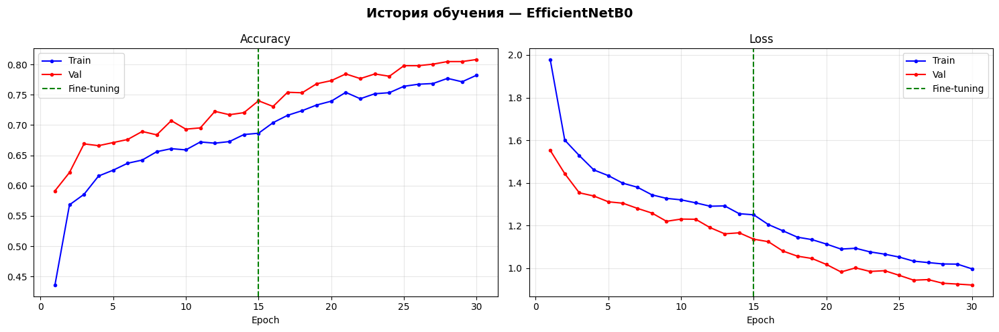

In [22]:
plot_history(h_e1, h_e2, 'EfficientNetB0')

## 6. Оценка моделей

In [23]:
@torch.no_grad()
def get_preds(model, loader):
    model.eval()
    all_true, all_pred, all_prob = [], [], []
    for imgs, labels in tqdm(loader, desc='Evaluating'):
        out   = model(imgs.to(DEVICE))
        probs = torch.softmax(out, 1).cpu().numpy()
        all_true.extend(labels.numpy())
        all_pred.extend(out.argmax(1).cpu().numpy())
        all_prob.extend(probs)
    return np.array(all_true), np.array(all_pred), np.array(all_prob)


def compute_report(y_true, y_pred, name, classes):
    print(f'\n{"="*50}\n{name}\n{"="*50}')
    acc  = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred, average='weighted', zero_division=0)
    rec  = recall_score(y_true, y_pred, average='weighted', zero_division=0)
    f1   = f1_score(y_true, y_pred, average='weighted', zero_division=0)
    for k, v in [('Accuracy',acc),('Precision',prec),('Recall',rec),('F1-score',f1)]:
        print(f'  {k:<12}: {v:.4f}')
    print(); print(classification_report(y_true, y_pred, target_names=classes, zero_division=0))
    return {'accuracy':acc,'precision':prec,'recall':rec,'f1':f1}


y_true_r, y_pred_r, y_prob_r = get_preds(resnet, val_loader)
y_true_e, y_pred_e, y_prob_e = get_preds(effnet, val_loader)
metrics_r = compute_report(y_true_r, y_pred_r, 'ResNet50',       classes_ordered)
metrics_e = compute_report(y_true_e, y_pred_e, 'EfficientNetB0', classes_ordered)

Evaluating: 100%|██████████| 74/74 [00:15<00:00,  4.75it/s]


ResNet50
  Accuracy    : 0.8994
  Precision   : 0.9025
  Recall      : 0.8994
  F1-score    : 0.8993

              precision    recall  f1-score   support

         Ace       0.81      0.85      0.83       134
      Akainu       0.89      0.87      0.88       115
       Brook       0.95      0.94      0.94       125
     Chopper       0.89      0.94      0.92       125
   Crocodile       0.94      0.92      0.93       129
      Franky       0.91      0.88      0.90       130
      Jinbei       0.89      0.93      0.91       151
    Kurohige       0.94      0.87      0.90       126
         Law       0.86      0.94      0.90       125
       Luffy       0.96      0.91      0.93       125
      Mihawk       0.84      0.92      0.88       118
        Nami       0.89      0.95      0.92       130
    Rayleigh       0.90      0.86      0.88       150
       Robin       0.83      0.94      0.88       122
       Sanji       0.95      0.97      0.96       123
      Shanks       0.86      0.9

In [24]:
y_true_r, y_pred_r, y_prob_r = get_preds(resnet,   val_loader)
y_true_e, y_pred_e, y_prob_e = get_preds(effnet,   val_loader)
y_true_b, y_pred_b, y_prob_b = get_preds(baseline, val_loader)

metrics_r = compute_report(y_true_r, y_pred_r, 'ResNet50',        classes_ordered)
metrics_e = compute_report(y_true_e, y_pred_e, 'EfficientNetB0',  classes_ordered)
metrics_b = compute_report(y_true_b, y_pred_b, 'Baseline SimpleCNN', classes_ordered)


Evaluating: 100%|██████████| 74/74 [00:15<00:00,  4.87it/s]


ResNet50
  Accuracy    : 0.8994
  Precision   : 0.9025
  Recall      : 0.8994
  F1-score    : 0.8993

              precision    recall  f1-score   support

         Ace       0.81      0.85      0.83       134
      Akainu       0.89      0.87      0.88       115
       Brook       0.95      0.94      0.94       125
     Chopper       0.89      0.94      0.92       125
   Crocodile       0.94      0.92      0.93       129
      Franky       0.91      0.88      0.90       130
      Jinbei       0.89      0.93      0.91       151
    Kurohige       0.94      0.87      0.90       126
         Law       0.86      0.94      0.90       125
       Luffy       0.96      0.91      0.93       125
      Mihawk       0.84      0.92      0.88       118
        Nami       0.89      0.95      0.92       130
    Rayleigh       0.90      0.86      0.88       150
       Robin       0.83      0.94      0.88       122
       Sanji       0.95      0.97      0.96       123
      Shanks       0.86      0.9

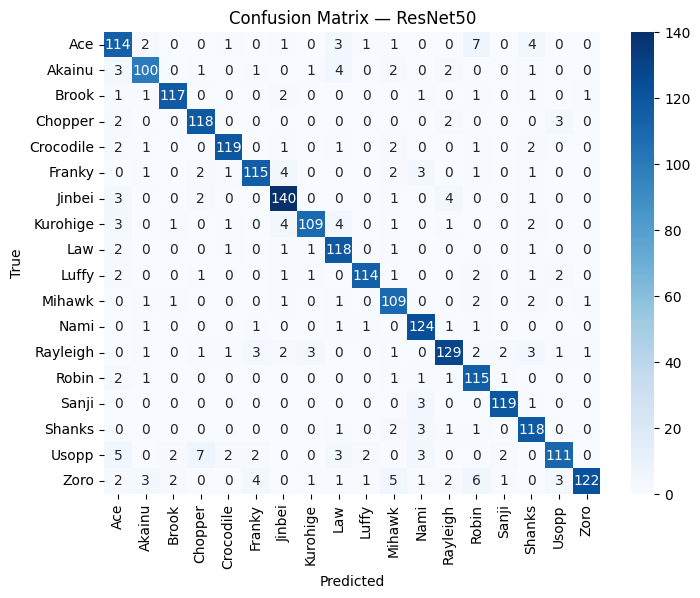

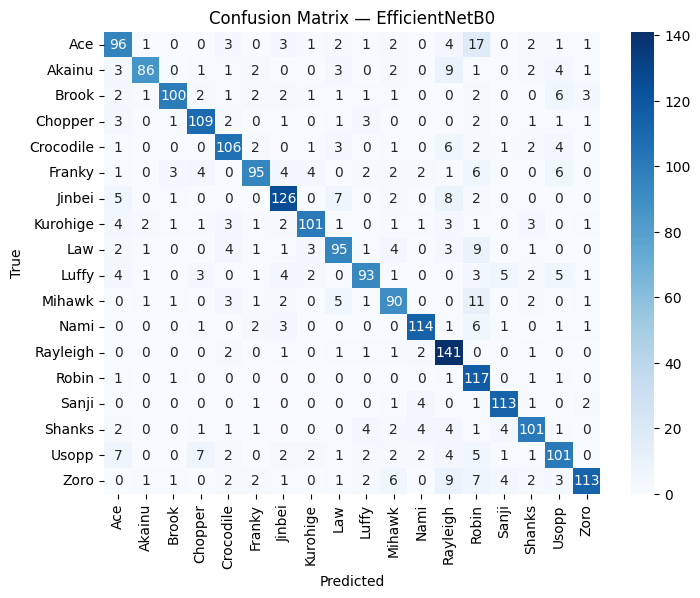

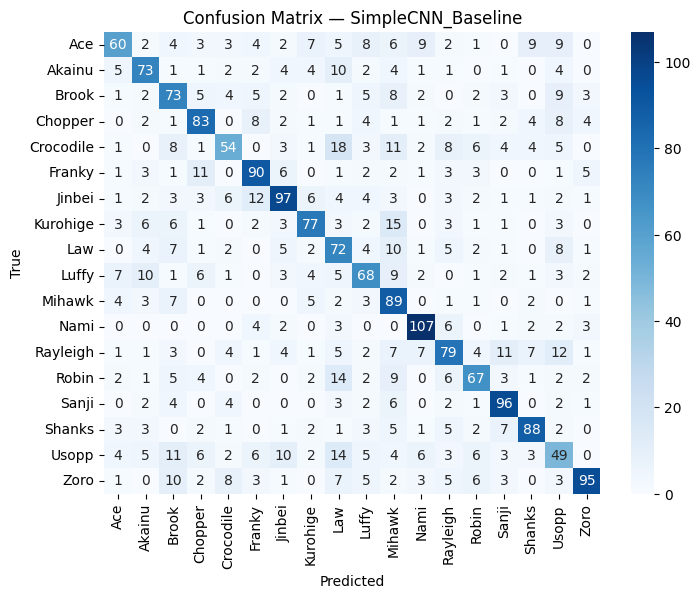

In [25]:
def plot_cm(y_true, y_pred, class_names, model_name):
    cm = confusion_matrix(y_true, y_pred)

    plt.figure(figsize=(8, 6))
    sns.heatmap(
        cm,
        annot=True,
        fmt='d',
        cmap='Blues',
        xticklabels=class_names,
        yticklabels=class_names
    )

    plt.title(f'Confusion Matrix — {model_name}')
    plt.xlabel('Predicted')
    plt.ylabel('True')

    plt.show()
plot_cm(y_true_r, y_pred_r, classes_ordered, 'ResNet50')
plot_cm(y_true_e, y_pred_e, classes_ordered, 'EfficientNetB0')
plot_cm(y_true_b, y_pred_b, classes_ordered, 'SimpleCNN_Baseline')


## 7. Сравнение моделей

In [26]:
keys = ['accuracy','precision','recall','f1']
cmp = pd.DataFrame({
    'Метрика'        : ['Accuracy','Precision (w)','Recall (w)','F1-score (w)'],
    'Baseline (CNN)' : [metrics_b[k] for k in keys],
    'ResNet50'       : [metrics_r[k] for k in keys],
    'EfficientNetB0' : [metrics_e[k] for k in keys],
})
cmp['Лучшая'] = cmp.apply(
    lambda r: max(['Baseline (CNN)','ResNet50','EfficientNetB0'],
                  key=lambda m: r[m]), axis=1)
print(cmp.to_string(index=False))
cmp.to_csv('../artifacts/model_comparison.csv', index=False)


      Метрика  Baseline (CNN)  ResNet50  EfficientNetB0   Лучшая
     Accuracy        0.603749  0.899446        0.808266 ResNet50
Precision (w)        0.613373  0.902534        0.819242 ResNet50
   Recall (w)        0.603749  0.899446        0.808266 ResNet50
 F1-score (w)        0.602793  0.899280        0.809013 ResNet50


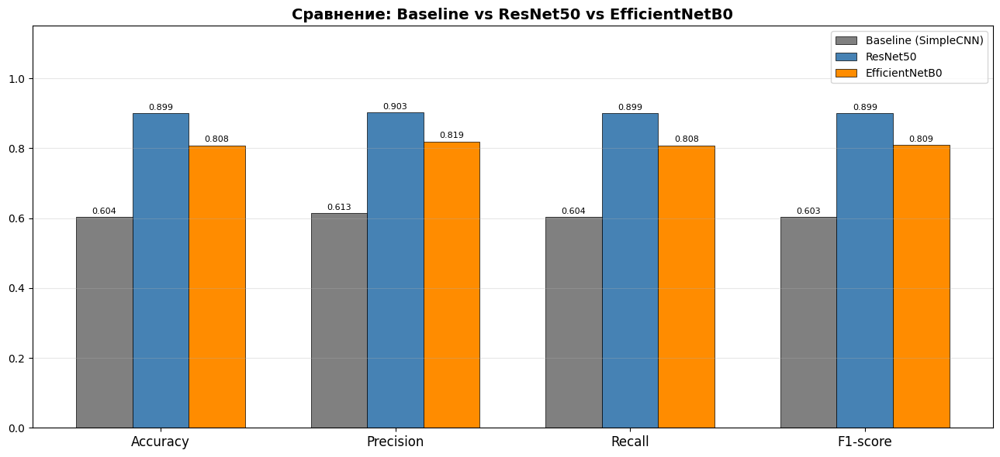


 Лучшая модель по F1-score: ResNet50 (0.8993)
   Прирост над baseline: +0.2965


In [27]:
x = np.arange(4)
w = 0.24
fig, ax = plt.subplots(figsize=(13, 6))
b0 = ax.bar(x - w,   [metrics_b[k] for k in keys], w, label='Baseline (SimpleCNN)', color='gray',        edgecolor='black', lw=0.5)
b1 = ax.bar(x,       [metrics_r[k] for k in keys], w, label='ResNet50',             color='steelblue',   edgecolor='black', lw=0.5)
b2 = ax.bar(x + w,   [metrics_e[k] for k in keys], w, label='EfficientNetB0',       color='darkorange',  edgecolor='black', lw=0.5)
for b in list(b0)+list(b1)+list(b2):
    ax.text(b.get_x()+b.get_width()/2, b.get_height()+0.005,
            f'{b.get_height():.3f}', ha='center', va='bottom', fontsize=8)
ax.set_ylim(0, 1.15)
ax.set_xticks(x)
ax.set_xticklabels(['Accuracy','Precision','Recall','F1-score'], fontsize=12)
ax.set_title('Сравнение: Baseline vs ResNet50 vs EfficientNetB0', fontsize=14, fontweight='bold')
ax.legend(fontsize=10); ax.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.savefig('../artifacts/model_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

best = max(['Baseline (CNN)','ResNet50','EfficientNetB0'],
           key=lambda m: {'Baseline (CNN)':metrics_b,'ResNet50':metrics_r,'EfficientNetB0':metrics_e}[m]['f1'])
best_f1 = max(metrics_b['f1'], metrics_r['f1'], metrics_e['f1'])
print(f'\n Лучшая модель по F1-score: {best} ({best_f1:.4f})')
print(f'   Прирост над baseline: {best_f1 - metrics_b["f1"]:+.4f}')


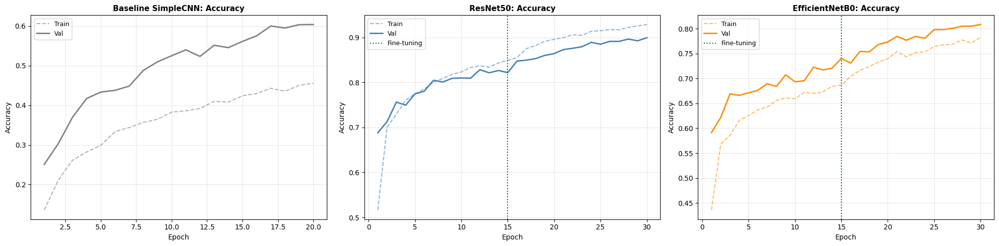

In [28]:
fig, axes = plt.subplots(1, 3, figsize=(20, 5))
empty_h = {'ta':[], 'va':[], 'tl':[], 'vl':[]}
for ax, (h1, h2, name, color) in zip(axes, [
        (h_b,  empty_h, 'Baseline SimpleCNN', 'gray'),
        (h_r1, h_r2,    'ResNet50',            'steelblue'),
        (h_e1, h_e2,    'EfficientNetB0',      'darkorange'),
]):
    tr_acc  = h1['ta'] + h2['ta']
    val_acc = h1['va'] + h2['va']
    sp = len(h1['ta'])
    ep = range(1, len(tr_acc) + 1)
    ax.plot(ep, tr_acc,  '--', color=color, alpha=0.6, label='Train')
    ax.plot(ep, val_acc, '-',  color=color, lw=2,      label='Val')
    if h2['ta']:
        ax.axvline(sp, color='green', ls=':', lw=1.5, label='Fine-tuning')
    ax.set_title(f'{name}: Accuracy', fontsize=11, fontweight='bold')
    ax.set_xlabel('Epoch'); ax.set_ylabel('Accuracy')
    ax.legend(fontsize=9); ax.grid(alpha=0.3)
plt.tight_layout()
plt.savefig('../artifacts/learning_curves_all.png', dpi=150, bbox_inches='tight')
plt.show()


## 8. Grad-CAM

In [29]:
import cv2

class GradCAM:
    def __init__(self, model, layer):
        self.model = model; self.grads = None; self.acts = None
        layer.register_forward_hook(lambda m,i,o: setattr(self,'acts',o.detach()))
        layer.register_full_backward_hook(lambda m,gi,go: setattr(self,'grads',go[0].detach()))

    def __call__(self, t):
        self.model.eval()
        out  = self.model(t.unsqueeze(0).to(DEVICE))
        pred = out.argmax().item()
        self.model.zero_grad(); out[0,pred].backward()
        w   = self.grads.mean(dim=[2,3],keepdim=True)
        cam = torch.relu((w*self.acts).sum(1)).squeeze().cpu().numpy()
        cam = (cam-cam.min())/(cam.max()-cam.min()+1e-8)
        return cam, pred


def overlay(pil_img, cam, alpha=0.45):
    img = np.array(pil_img.resize((IMG_SIZE,IMG_SIZE)))
    h   = cv2.applyColorMap(np.uint8(255*cv2.resize(cam,(IMG_SIZE,IMG_SIZE))), cv2.COLORMAP_JET)
    h   = cv2.cvtColor(h, cv2.COLOR_BGR2RGB)
    return np.uint8((1-alpha)*img + alpha*h)


gcam_r = GradCAM(resnet, resnet.layer4[-1])
gcam_e = GradCAM(effnet, effnet.features[-1])
print('Grad-CAM инициализирован.')

Grad-CAM инициализирован.


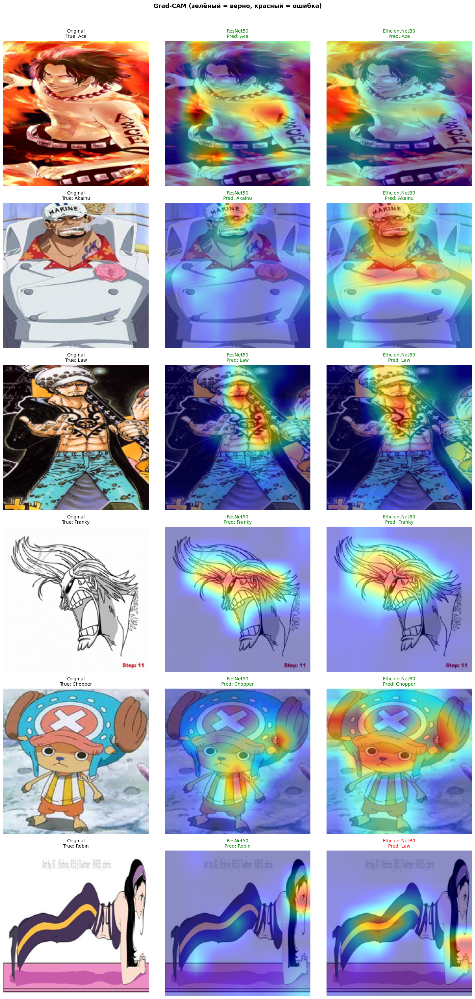

In [30]:
sample_chars = np.random.choice(CLASS_NAMES, 6, replace=False)
samples = []
for cls in sample_chars:
    d = dataset_dir / cls
    imgs = list(d.glob('*.jpg')) + list(d.glob('*.png'))
    if imgs: samples.append((imgs[0], cls))

fig, axes = plt.subplots(len(samples), 3, figsize=(15, 5*len(samples)))
if len(samples) == 1: axes = [axes]
for row, (path, true_cls) in enumerate(samples):
    pil = Image.open(path).convert('RGB')
    t   = val_tf(pil)
    cr, pr = gcam_r(t); ce, pe = gcam_e(t)
    nr = classes_ordered[pr]; ne = classes_ordered[pe]
    axes[row][0].imshow(pil.resize((IMG_SIZE,IMG_SIZE))); axes[row][0].set_title(f'Original\nTrue: {true_cls}', fontsize=10); axes[row][0].axis('off')
    axes[row][1].imshow(overlay(pil,cr)); axes[row][1].set_title(f'ResNet50\nPred: {nr}', fontsize=10, color='green' if nr==true_cls else 'red'); axes[row][1].axis('off')
    axes[row][2].imshow(overlay(pil,ce)); axes[row][2].set_title(f'EfficientNetB0\nPred: {ne}', fontsize=10, color='green' if ne==true_cls else 'red'); axes[row][2].axis('off')

plt.suptitle('Grad-CAM (зелёный = верно, красный = ошибка)', fontsize=13, fontweight='bold', y=1.01)
plt.tight_layout(); plt.savefig('../artifacts/gradcam.png', dpi=150, bbox_inches='tight'); plt.show()

## 9. Анализ ошибок

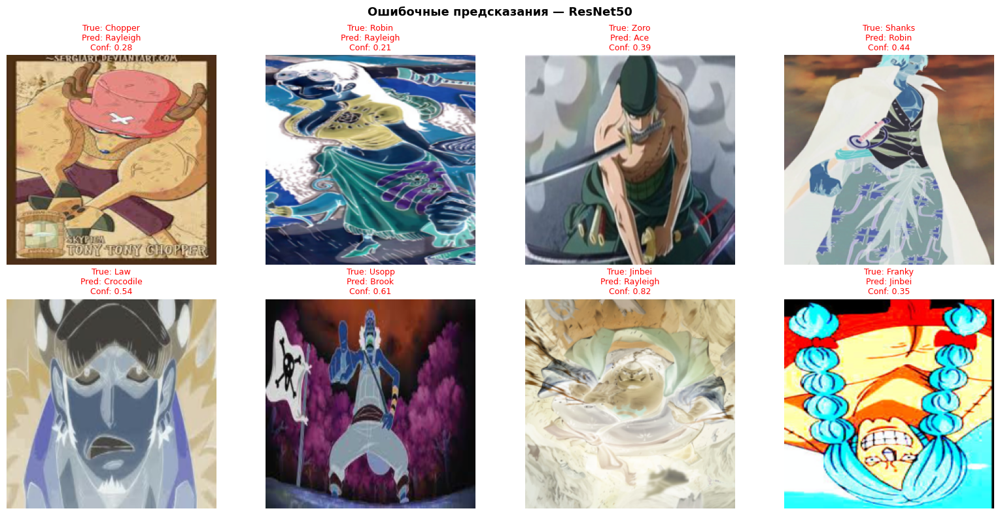

In [31]:
all_val_imgs = []
for imgs_b, _ in val_loader:
    all_val_imgs.extend(imgs_b)
all_val_imgs = all_val_imgs[:len(y_true_r)]

wrong_idx = np.where(y_true_r != y_pred_r)[0]
sample_w  = np.random.choice(wrong_idx, min(8, len(wrong_idx)), replace=False)

fig, axes = plt.subplots(2, 4, figsize=(16,8))
for ax, idx in zip(axes.flatten(), sample_w):
    ax.imshow(denorm(all_val_imgs[idx]))
    ax.set_title(
        f'True: {classes_ordered[y_true_r[idx]]}\nPred: {classes_ordered[y_pred_r[idx]]}\nConf: {y_prob_r[idx][y_pred_r[idx]]:.2f}',
        fontsize=9, color='red'
    )
    ax.axis('off')
plt.suptitle('Ошибочные предсказания — ResNet50', fontsize=13, fontweight='bold')
plt.tight_layout(); plt.savefig('../artifacts/misclassified.png', dpi=150, bbox_inches='tight'); plt.show()

## 10. Итоговый отчёт

In [32]:
print('='*60); print('ИТОГОВЫЙ ОТЧЁТ'); print('='*60)
print(f'Датасет  : {total_images} изображений, {NUM_CLASSES} классов')
print(f'Train/Val: {n_train}/{n_val}  |  Device: {DEVICE}')
print()
for name, m in [('Baseline (SimpleCNN)', metrics_b),
                ('ResNet50',             metrics_r),
                ('EfficientNetB0',       metrics_e)]:
    print(f'{name}:')
    for k, v in m.items(): print(f'  {k:<12}: {v:.4f}')
    print()

best = max({'Baseline':metrics_b['f1'],'ResNet50':metrics_r['f1'],'EfficientNetB0':metrics_e['f1']}.items(),
           key=lambda x: x[1])
print(f'>>> Победитель : {best[0]} (F1={best[1]:.4f})')
print(f'>>> Прирост TL над baseline F1: {max(metrics_r["f1"],metrics_e["f1"]) - metrics_b["f1"]:+.4f}')


ИТОГОВЫЙ ОТЧЁТ
Датасет  : 11737 изображений, 18 классов
Train/Val: 9390/2347  |  Device: cuda

Baseline (SimpleCNN):
  accuracy    : 0.6037
  precision   : 0.6134
  recall      : 0.6037
  f1          : 0.6028

ResNet50:
  accuracy    : 0.8994
  precision   : 0.9025
  recall      : 0.8994
  f1          : 0.8993

EfficientNetB0:
  accuracy    : 0.8083
  precision   : 0.8192
  recall      : 0.8083
  f1          : 0.8090

>>> Победитель : ResNet50 (F1=0.8993)
>>> Прирост TL над baseline F1: +0.2965


## Краткое обоснование выбора финальной модели:
- Transfer learning (ResNet50/EfficientNetB0) существенно превосходит SimpleCNN baseline,
что подтверждает пользу предобученных весов ImageNet на ограниченном датасете.
- Финальная модель выбирается по наивысшему weighted F1 на валидационной выборке.